In [21]:
import pandas as pd
import json
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np

In [28]:

study = "corona"
with open(f"../config/features.txt") as f:
    features = json.load(f)

freq = "4epochs"
FEATURES = features[study][freq]

raw_behaviour_vector = pd.read_csv(
    f"../data/processed/corona/vector_corona_{freq}.csv",
    index_col=0
)
raw_behaviour_vector['date'] = pd.to_datetime(raw_behaviour_vector['date'])
raw_behaviour_vector.sort_values(['subject_id','date'],inplace=True)

raw_behaviour_vector.dropna(subset=FEATURES, inplace=True)

ids_cols = ['date', 'subject_id']
behaviour_vector = raw_behaviour_vector[FEATURES + ids_cols]

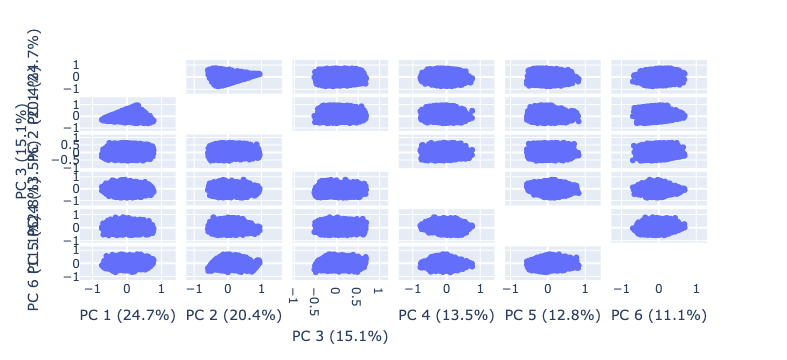

In [48]:
import plotly.express as px
from sklearn.decomposition import PCA


pca = PCA()
components = pca.fit_transform(behaviour_vector[FEATURES])
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(6)
)
fig.update_traces(diagonal_visible=False)
fig.show()

In [23]:
# kmeans

# Determine optimal cluster number with elbow method
wcss = []

silhouette_scores = []
for i in range(2, 11):
    model = KMeans(n_clusters = i,     
                    init = 'k-means++',                 # Initialization method for kmeans
                    max_iter = 300,                     # Maximum number of iterations 
                    n_init = 10,                        # Choose how often algorithm will run with different centroid 
                    random_state = 0)                   # Choose random state for reproducibility
    labels = model.fit_predict(behaviour_vector[FEATURES])

    # Silhouette Index
    silhouette_avg = silhouette_score(behaviour_vector[FEATURES], labels)
    silhouette_scores.append(silhouette_avg)

# Determine optimal cluster number using maximum Silhouette score and maximum Dunn index
optimal_clusters_silhouette = np.argmax(silhouette_scores) + 2 
print("Optimal num cluster: ", optimal_clusters_silhouette)

Optimal num cluster:  3


In [42]:
kmeans = KMeans(n_clusters = optimal_clusters_silhouette,                 # Set amount of clusters
                init = 'k-means++',             # Initialization method for kmeans
                max_iter = 300,                 # Maximum number of iterations
                n_init = 10,                    # Choose how often algorithm will run with different centroid
                random_state = 0)               # Choose random state for reproducibility

f = ["heart_rate_variability_avg", "stepsx1000:total", "steps:night:norm", "steps:morning:norm", "steps:afternoon:norm", "steps:evening:norm", "tst", "midsleep",'cluster']
test = raw_behaviour_vector[f]
pred_y = kmeans.fit_predict(test)

raw_behaviour_vector['cluster'] = kmeans.labels_
raw_behaviour_vector.groupby('cluster')[f].mean()
#raw_behaviour_vector.cluster.value_counts()
# Denote

# Daily clusters
# 0: Night-active individuals with less day activity and later sleep midpoint.
# 1: Morning-active individuals with earlier sleep times.
# 2: Afternoon-active individuals with higher overall activity and variability.
# 3:Evening-active individuals with increased HRV

# Weekly clusters - Pattern
# 0: 
# 1: Significantly reduce steps count, increased hrv


,heart_rate_variability_avg,stepsx1000:total,steps:night:norm,steps:morning:norm,steps:afternoon:norm,steps:evening:norm,tst,midsleep,cluster
cluster,,,,,,,,,
0,35.258612,10.093029,0.023801,0.269020,0.416424,0.290755,7.300457,27.606689,0
1,105.059791,12.904203,0.015759,0.256899,0.397287,0.330055,7.347785,27.576882,1
2,61.183218,10.305671,0.021431,0.255767,0.412669,0.310132,7.212800,27.742680,2


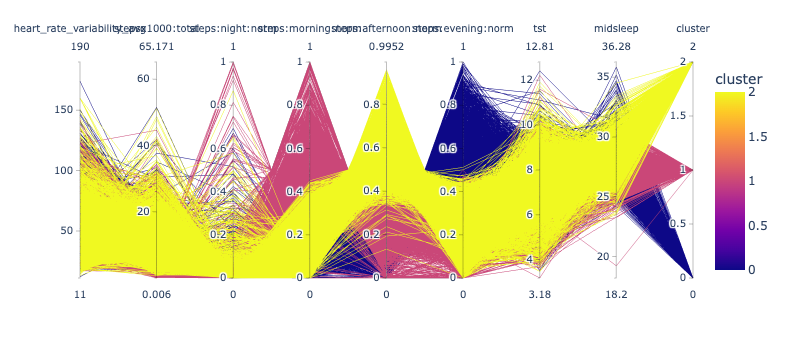

In [37]:
import plotly.express as px

df = raw_behaviour_vector[["heart_rate_variability_avg", "stepsx1000:total", "steps:night:norm", "steps:morning:norm", "steps:afternoon:norm", "steps:evening:norm", "tst", "midsleep",'cluster']]
fig = px.parallel_coordinates(df, color="cluster")
fig.show()

In [33]:
df

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4
...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3
240,27.18,2.00,Female,Yes,Sat,Dinner,2
241,22.67,2.00,Male,Yes,Sat,Dinner,2
242,17.82,1.75,Male,No,Sat,Dinner,2
